## Installing PyTorch Library
This cell installs the PyTorch library, which is essential for building and training deep learning models in Python.


In [1]:
pip install torch 

Defaulting to user installation because normal site-packages is not writeable
  Using cached torch-2.5.1-cp311-cp311-win_amd64.whl.metadata (28 kB)
  Using cached filelock-3.16.1-py3-none-any.whl.metadata (2.9 kB)
  Using cached networkx-3.4.2-py3-none-any.whl.metadata (6.3 kB)
  Using cached fsspec-2024.10.0-py3-none-any.whl.metadata (11 kB)
Using cached torch-2.5.1-cp311-cp311-win_amd64.whl (203.1 MB)
Using cached filelock-3.16.1-py3-none-any.whl (16 kB)
Using cached fsspec-2024.10.0-py3-none-any.whl (179 kB)
Using cached networkx-3.4.2-py3-none-any.whl (1.7 MB)
Note: you may need to restart the kernel to use updated packages.


DEPRECATION: Loading egg at c:\program files\python311\lib\site-packages\vboxapi-1.0-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330

[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## Installing Torchvision Library
This cell installs `torchvision`, which provides datasets, model architectures, and image transformation utilities that complement PyTorch.


In [2]:
pip install torchvision

Defaulting to user installation because normal site-packages is not writeable
  Using cached torchvision-0.20.1-cp311-cp311-win_amd64.whl.metadata (6.2 kB)
Using cached torchvision-0.20.1-cp311-cp311-win_amd64.whl (1.6 MB)
Note: you may need to restart the kernel to use updated packages.


DEPRECATION: Loading egg at c:\program files\python311\lib\site-packages\vboxapi-1.0-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330

[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## Importing Required Libraries
This cell imports essential libraries for handling data, building the model, and visualizing results, including `torch`, `torchvision`, and `matplotlib`.


In [34]:
pip install torchsummary

Note: you may need to restart the kernel to use updated packages.


In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import numpy as np
import os

## Object Detection Model Pipeline

This notebook walks through the steps required to build and train a convolutional neural network (CNN) model to detect bounding boxes in images. The pipeline is organized into the following key stages:

### 1. **Defining the BoundingBoxDataset Class**
The `BoundingBoxDataset` class is a custom dataset used to load images and their corresponding bounding box annotations. This class handles:
- Loading images from disk.
- Loading bounding box annotations (typically in the format [x_min, y_min, x_max, y_max]).
- Applying any necessary transformations such as resizing or normalization to the images and bounding boxes.

### 2. **Defining the Detection Model**
The `DetectionModel` class defines the architecture of the CNN. The model consists of:
- Several **convolutional layers** to extract features from input images.
- **ReLU activation** functions for non-linearity.
- **Fully connected layers** to predict the bounding box coordinates.

The model's output layer is designed to predict bounding box coordinates in the format `[x_min, y_min, x_max, y_max]`.

### 3. **Training Function for the Model**
The `train_model` function is responsible for training the detection model. The training loop includes:
- **Forward pass**: Input images are passed through the model to obtain predictions.
- **Loss calculation**: The model's predicted bounding box coordinates are compared to the ground truth using a suitable loss function (e.g., Mean Squared Error).
- **Backpropagation**: Gradients are computed and the model’s weights are updated.
- **Tracking and reporting the loss**: After each epoch, the loss is printed to track the training progress.

### 4. **Setting Hyperparameters and Preparing Data**
In this section, key hyperparameters such as:
- **Batch size**: The number of samples per batch.
- **Learning rate**: The step size for weight updates.
- **Epochs**: The number of times the model will iterate through the entire dataset.

Additionally, data transformations are applied, and the training dataset is loaded into a `DataLoader` for efficient batch processing during training.

### 5. **Initializing and Training the Model**
This final step involves:
- **Instantiating the model**: Creating an instance of the `DetectionModel`.
- **Setting up the optimizer and loss function**: Choosing the optimizer (e.g., Adam) and loss function (e.g., MSE loss).
- **Training the model**: Running the training loop for the specified number of epochs.

---

By the end of this pipeline, the model will be trained to predict bounding boxes for objects in images, enabling it to perform object detection tasks.



In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import numpy as np
import os
import matplotlib.pyplot as plt

# Dataset class
class BoundingBoxDataset(Dataset):
    def __init__(self, image_dir, label_dir, transform=None):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.transform = transform
        self.images = []
        self.bboxes = []
        self._load_data()
    
    def _load_data(self):
        for filename in os.listdir(self.image_dir):
            img_path = os.path.join(self.image_dir, filename)
            label_path = os.path.join(self.label_dir, filename.replace('.jpg', '.txt'))
            if not os.path.exists(img_path) or not os.path.exists(label_path):
                continue
            image = Image.open(img_path).convert("RGB")
            if self.transform:
                image = self.transform(image)
            with open(label_path, 'r') as f:
                line = f.readline().strip()
                if line:
                    # Parse the bounding box, ignoring the class_id
                    _, x_center, y_center, width, height = map(float, line.split())
                    xmin = x_center - width / 2
                    ymin = y_center - height / 2
                    xmax = x_center + width / 2
                    ymax = y_center + height / 2
                    self.images.append(image)
                    self.bboxes.append(torch.tensor([xmin, ymin, xmax, ymax]))
        print(f"Loaded {len(self.images)} images and {len(self.bboxes)} bounding boxes.")

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.bboxes[idx]

# Updated Model with More Layers
class DetectionModel(nn.Module):
    def __init__(self):
        super(DetectionModel, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.fc1 = nn.Linear(256 * 8 * 8, 128)  # Adjusted for assumed 128x128 input images
        self.fc2 = nn.Linear(128, 4)  # Output for bounding box (xmin, ymin, xmax, ymax)

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = torch.relu(self.fc1(x))
        x = torch.sigmoid(self.fc2(x))  # Normalized output for bounding box predictions
        return x

# Training function with loss tracking
def train_model(model, dataloader, criterion, optimizer, device, epochs):
    model.train()
    loss_values = []
    for epoch in range(epochs):
        running_loss = 0.0
        for images, bboxes in dataloader:
            images, bboxes = images.to(device), bboxes.to(device)
            
            # Zero the parameter gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(images)

            # Compute loss
            loss = criterion(outputs, bboxes)
            loss.backward()
            optimizer.step()
            
            # Track loss
            running_loss += loss.item() * images.size(0)
        
        epoch_loss = running_loss / len(dataloader.dataset)
        loss_values.append(epoch_loss)
        print(f"Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}")
    
    # Plot loss over epochs
    plt.plot(range(1, epochs + 1), loss_values, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss over Epochs')
    plt.legend()
    plt.show()

# Hyperparameters and setup
batch_size = 16
learning_rate = 0.001
epochs = 20
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Transformations and DataLoader
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])
# Load dataset
image_dir = 'C:/Users/Rishikesh Katakam/Documents/LPR/lpr.v1i.yolov8/train/images'
label_dir = 'C:/Users/Rishikesh Katakam/Documents/LPR/lpr.v1i.yolov8/train/labels'

dataset = BoundingBoxDataset(image_dir, label_dir, transform=transform)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Instantiate model, loss, optimizer
model = DetectionModel().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Train the model
train_model(model, dataloader, criterion, optimizer, device, epochs)

# Plotting function for predictions
def plot_predictions(dataloader, model, device):
    model.eval()
    with torch.no_grad():
        for images, bboxes in dataloader:
            images = images.to(device)
            outputs = model(images).cpu()
            bboxes = bboxes.cpu()
            for i in range(len(images)):
                pred_box = outputs[i].numpy() * 128  # Scale predictions to image size
                true_box = bboxes[i].numpy() * 128
                fig, ax = plt.subplots(1)
                ax.imshow(images[i].permute(1, 2, 0).cpu())
                rect_pred = plt.Rectangle((pred_box[0], pred_box[1]), 
                                          pred_box[2] - pred_box[0], 
                                          pred_box[3] - pred_box[1], 
                                          linewidth=2, edgecolor='r', facecolor='none')
                ax.add_patch(rect_pred)
                rect_true = plt.Rectangle((true_box[0], true_box[1]), 
                                          true_box[2] - true_box[0], 
                                          true_box[3] - true_box[1], 
                                          linewidth=2, edgecolor='g', facecolor='none')
                ax.add_patch(rect_true)
                plt.title("Red: Predicted | Green: True")
                plt.show()
            break

## Plotting Model Predictions
This cell defines and runs a function that visualizes the model's predicted bounding boxes compared to the ground truth on sample images.


Loaded 804 images and 804 bounding boxes.
Epoch 1/20, Loss: 0.0134
Epoch 2/20, Loss: 0.0065
Epoch 3/20, Loss: 0.0048
Epoch 4/20, Loss: 0.0033
Epoch 5/20, Loss: 0.0021
Epoch 6/20, Loss: 0.0017
Epoch 7/20, Loss: 0.0010
Epoch 8/20, Loss: 0.0006
Epoch 9/20, Loss: 0.0005
Epoch 10/20, Loss: 0.0003
Epoch 11/20, Loss: 0.0002
Epoch 12/20, Loss: 0.0002
Epoch 13/20, Loss: 0.0002
Epoch 14/20, Loss: 0.0002
Epoch 15/20, Loss: 0.0001
Epoch 16/20, Loss: 0.0001
Epoch 17/20, Loss: 0.0001
Epoch 18/20, Loss: 0.0001
Epoch 19/20, Loss: 0.0001
Epoch 20/20, Loss: 0.0001


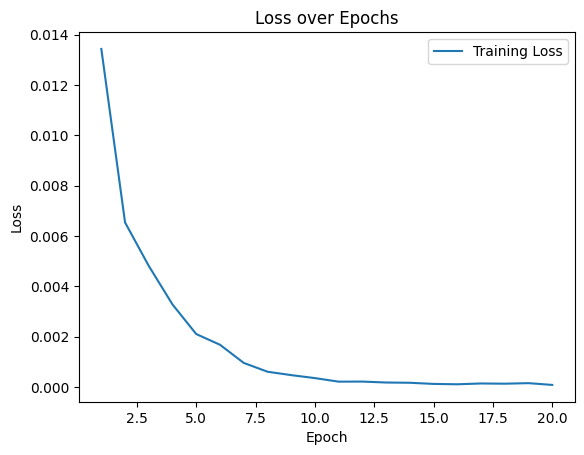

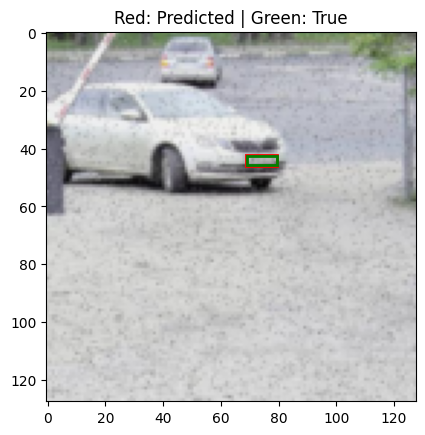

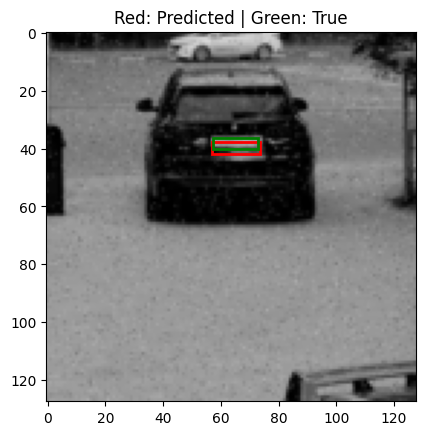

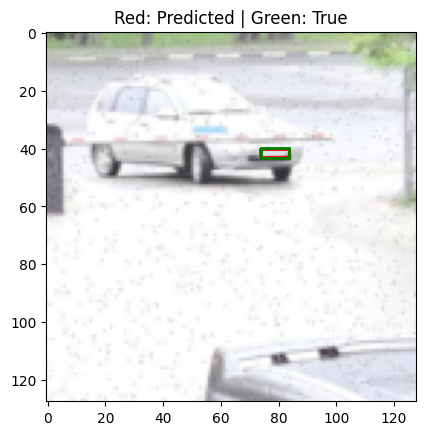

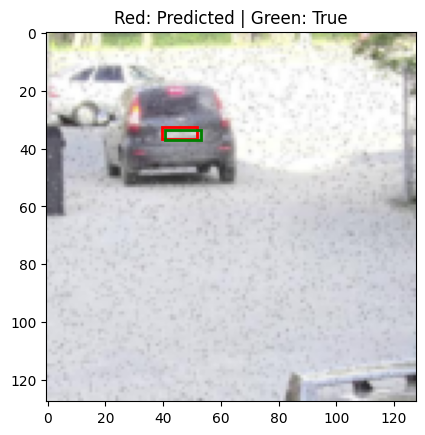

...

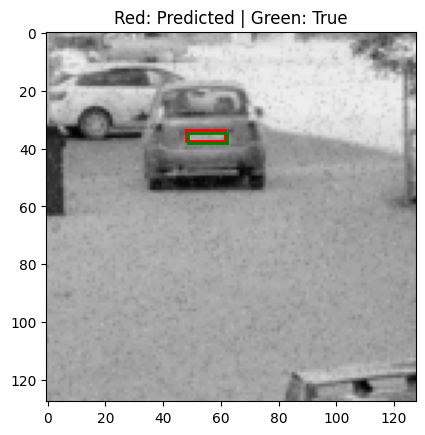

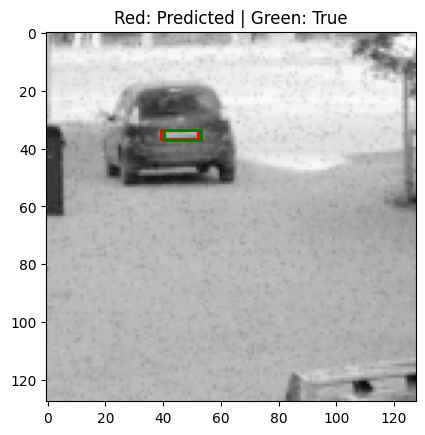

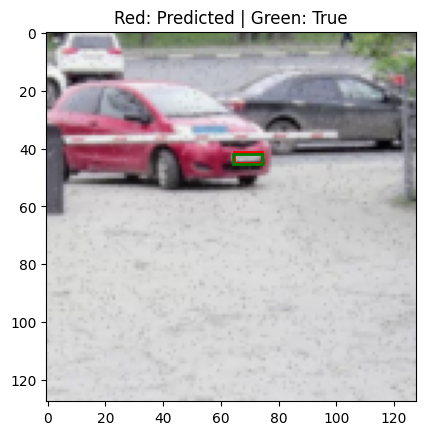

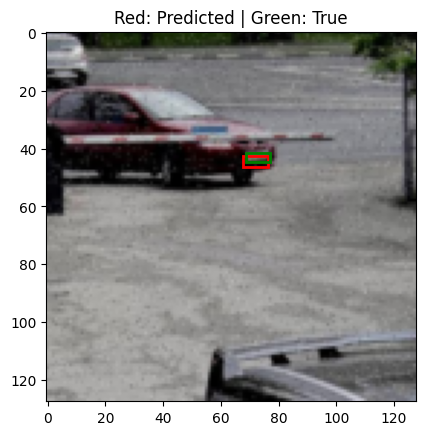

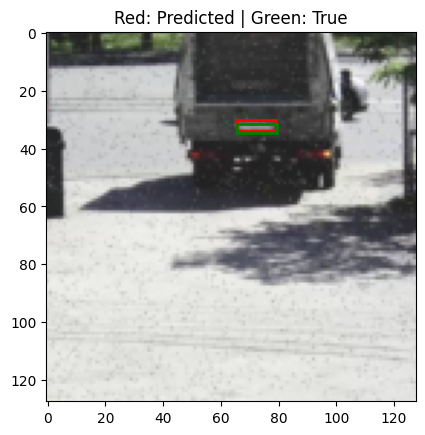

In [ ]:
# Visualize predictions
plot_predictions(dataloader, model, device)

## Displaying Model Architecture Summary
This cell prints a detailed summary of the model's layers, showing the output shape and number of parameters for each layer. It helps in understanding the model's structure and computational requirements.


In [35]:
from torchsummary import summary

# Instantiate the model
model = DetectionModel().to(device)

# Print the summary of the model
summary(model, input_size=(3, 128, 128))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]             896
              ReLU-2         [-1, 32, 128, 128]               0
         MaxPool2d-3           [-1, 32, 64, 64]               0
            Conv2d-4           [-1, 64, 64, 64]          18,496
              ReLU-5           [-1, 64, 64, 64]               0
         MaxPool2d-6           [-1, 64, 32, 32]               0
            Conv2d-7          [-1, 128, 32, 32]          73,856
              ReLU-8          [-1, 128, 32, 32]               0
         MaxPool2d-9          [-1, 128, 16, 16]               0
           Conv2d-10          [-1, 256, 16, 16]         295,168
             ReLU-11          [-1, 256, 16, 16]               0
        MaxPool2d-12            [-1, 256, 8, 8]               0
           Linear-13                  [-1, 128]       2,097,280
           Linear-14                   

## Model Evaluation and Visualization of Predictions

### Overview:
This part of the script is responsible for evaluating the trained model's performance on a test dataset and visualizing its predictions.

### Functions:
1. **`evaluate_model`**:
   - Evaluates the model on the test dataset and returns average test loss, MSE, and IoU.
   - **Key Steps**:
     - Sets the model to evaluation mode.
     - Iterates over the test data and performs forward passes to get predictions.
     - Calculates the loss using a given criterion and computes MSE for each batch.
     - Calculates IoU for each prediction compared to the ground truth bounding box.
     - Prints out the average metrics: test loss, MSE, and IoU for the dataset.

2. **`plot_predictions`**:
   - Visualizes the predicted and true bounding boxes for images in the test set.
   - **Key Steps**:
     - Iterates over the test data and displays images with predicted and true bounding boxes.
     - Uses different colors to distinguish predicted (red) and true (green) bounding boxes.
### Expected Outcome:
- **Metrics**: The script will output the average loss, MSE, and IoU to give insight into the model's performance.
- **Visualization**: Images from the test set will be displayed with predicted and true bounding boxes to provide a qualitative evaluation of the model.



Loaded 77 images and 77 bounding boxes.
Test Loss: 0.0035
Test MSE: 0.0141
Test IoU: 0.7854


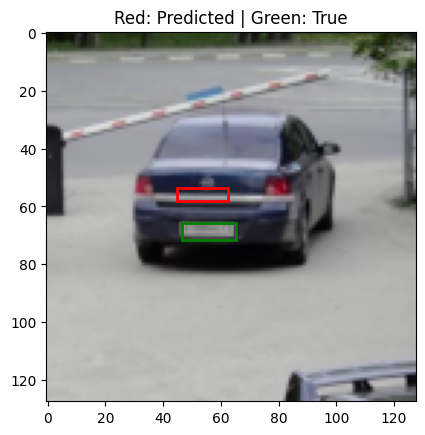

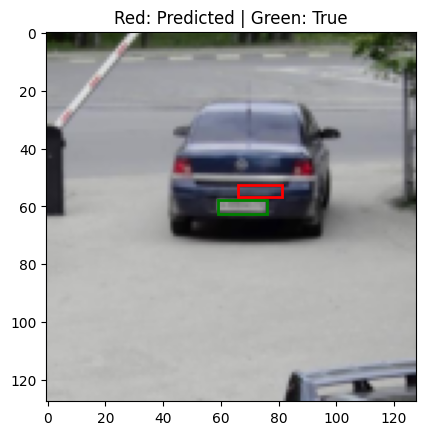

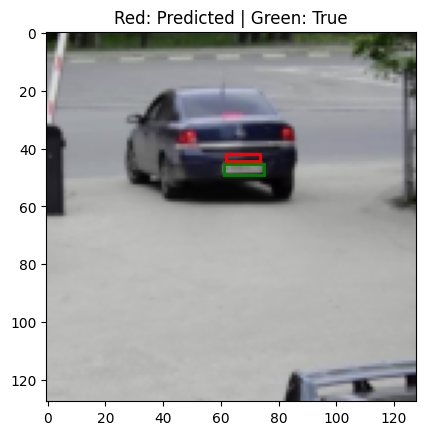

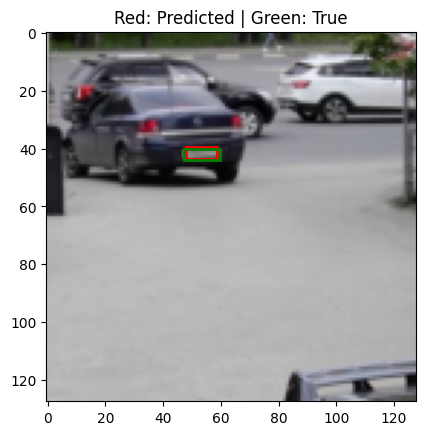

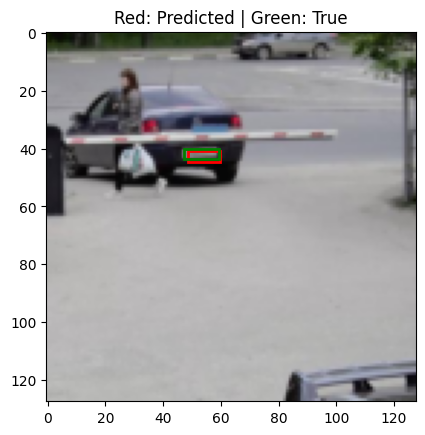

...

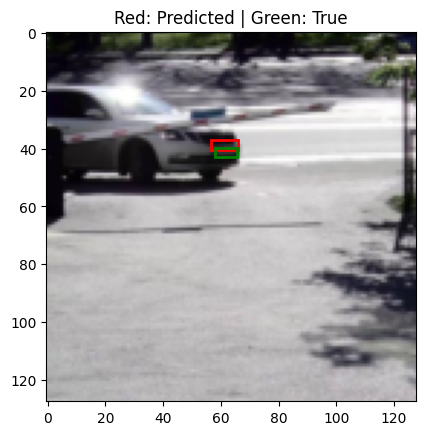

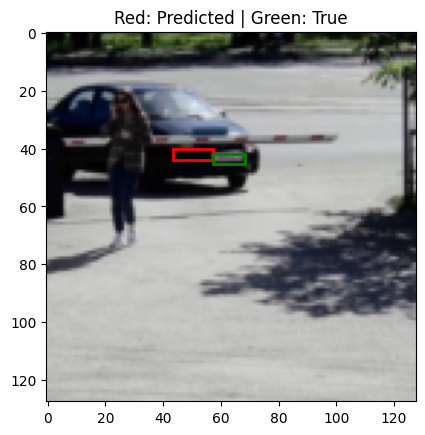

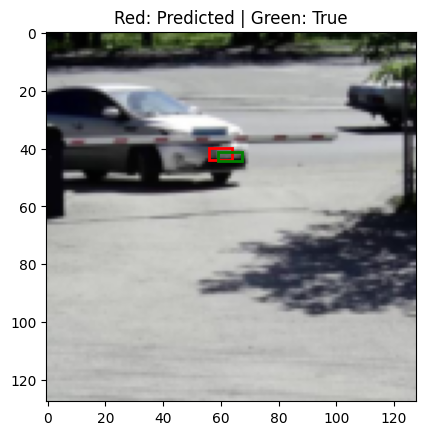

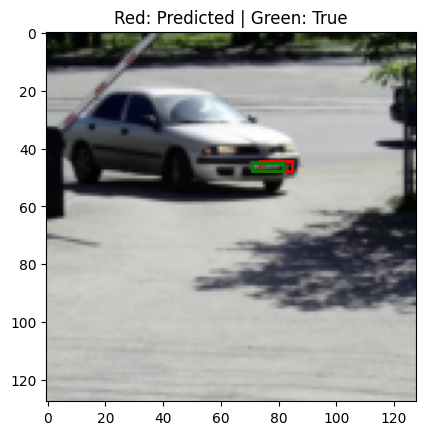

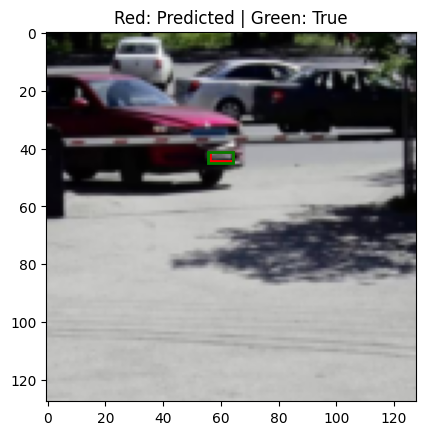

In [33]:
# main.py

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

def evaluate_model(model, dataloader, criterion, device, image_shape=(128, 128)):
    """Evaluates the model and returns average test loss, MSE, and IoU."""
    model.eval()
    total_loss = 0.0
    total_iou = 0.0
    total_mse = 0.0
    total_samples = 0
    mse_criterion = nn.MSELoss(reduction='sum')

    with torch.no_grad():
        for images, bboxes in dataloader:
            images, bboxes = images.to(device), bboxes.to(device)

            # Forward pass and loss calculation
            outputs = model(images)
            loss = criterion(outputs, bboxes)
            total_loss += loss.item() * images.size(0)
            total_mse += mse_criterion(outputs, bboxes).item()

            # IoU calculation for each sample
            for i in range(len(images)):
                pred_box = convert_to_unnormalized_bbox(outputs[i].cpu().numpy(), image_shape)
                true_box = bboxes[i].cpu().numpy()
                iou = compute_iou_unnormalized(pred_box, true_box, image_shape)
                total_iou += iou
                total_samples += 1

    avg_loss = total_loss / len(dataloader.dataset)
    avg_mse = total_mse / len(dataloader.dataset)
    avg_iou = total_iou / total_samples

    print(f"Test Loss: {avg_loss:.4f}")
    print(f"Test MSE: {avg_mse:.4f}")
    print(f"Test IoU: {avg_iou:.4f}")

    return avg_loss, avg_mse, avg_iou

def plot_predictions(dataloader, model, device, image_shape=(128, 128)):
    """Plots model predictions alongside true bounding boxes."""
    model.eval()
    with torch.no_grad():
        for images, bboxes in dataloader:
            images = images.to(device)
            outputs = model(images).cpu()
            bboxes = bboxes.cpu()

            for i in range(len(images)):
                # Convert predictions and true bounding boxes
                pred_box = outputs[i].numpy() * image_shape[0]
                true_box = bboxes[i].numpy() * image_shape[0]

                fig, ax = plt.subplots(1)
                ax.imshow(images[i].permute(1, 2, 0).cpu())
                
                # Plot predicted bounding box (Red)
                rect_pred = plt.Rectangle((pred_box[0], pred_box[1]), 
                                          pred_box[2] - pred_box[0], 
                                          pred_box[3] - pred_box[1], 
                                          linewidth=2, edgecolor='r', facecolor='none')
                ax.add_patch(rect_pred)

                # Plot true bounding box (Green)
                rect_true = plt.Rectangle((true_box[0], true_box[1]), 
                                          true_box[2] - true_box[0], 
                                          true_box[3] - true_box[1], 
                                          linewidth=2, edgecolor='g', facecolor='none')
                ax.add_patch(rect_true)

                plt.title("Red: Predicted | Green: True")
                plt.show()

# Example usage
if __name__ == "__main__":
     # User-provided paths
    test_image_dir = 'C:/Users/Rishikesh Katakam/Documents/LPR/lpr.v1i.yolov8/valid/images'
    test_label_dir = 'C:/Users/Rishikesh Katakam/Documents/LPR/lpr.v1i.yolov8/valid/labels'

    # Ensure the dataset and model are defined correctly.
    test_dataset = BoundingBoxDataset(test_image_dir, test_label_dir, transform=transform)
    test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Run evaluation
    avg_loss, avg_mse, avg_iou = evaluate_model(model, test_dataloader, criterion, device)

    # Plot predictions for visual verification
    plot_predictions(test_dataloader, model, device)

